# Substation Dataset Visualization

This notebook loads and visualizes samples from the TorchGeo Substation dataset.
The dataset contains multi-temporal, multi-spectral Sentinel-2 satellite images paired with segmentation masks of power substations.

In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
from torchgeo.datasets.substation import Substation

## 1. Load the Substation Dataset

In [2]:
# Initialize the Substation dataset with all 13 Sentinel-2 bands
# Sentinel-2 bands: B1(Coastal), B2(Blue), B3(Green), B4(Red), B5-B7(Veg Red Edge),
#                   B8(NIR), B8A(Veg Red Edge), B9(Water Vapour), B10(Cirrus), B11-B12(SWIR)
dataset = Substation(
    root='/home/admin/AGML_ResearchGroup/SuperResolution/substation',
    mask_2d=False,
    num_of_timepoints=4,
    timepoint_aggregation='median',
    download=True,
    checksum=False
)

print(f'Dataset size: {len(dataset)} samples')
print(f'Number of bands: {len(dataset[0]["image"])}')

Dataset size: 26522 samples
Number of bands: 13


## 2. Sample Random Indices

In [3]:
# Select random sample indices
num_samples = 15
random.seed(42)
sample_indices = random.sample(range(len(dataset)), num_samples)
print(f'Selected sample indices: {sample_indices}')

Selected sample indices: [20952, 3648, 819, 24299, 9012, 8024, 7314, 4572, 24132, 3358, 22174, 24270, 17870, 2848, 19349]


## 3. Load the Samples

In [4]:
# Load the samples
samples = [dataset[idx] for idx in sample_indices]

# Inspect sample structure
sample = samples[0]
print(f'Sample keys: {sample.keys()}')
print(f'Image shape: {sample["image"].shape}')
print(f'Mask shape: {sample["mask"].shape}')
print(f'Image dtype: {sample["image"].dtype}')
print(f'Mask dtype: {sample["mask"].dtype}')
print(f'Mask unique values: {sample["mask"].unique()}')

Sample keys: dict_keys(['image', 'mask'])
Image shape: torch.Size([13, 228, 228])
Mask shape: torch.Size([228, 228])
Image dtype: torch.float64
Mask dtype: torch.int64
Mask unique values: tensor([0, 1])


## 4. Visualization Helper Functions

In [5]:
# Sentinel-2 band names for reference
SENTINEL2_BANDS = [
    'B1 (Coastal)',      # 0
    'B2 (Blue)',         # 1
    'B3 (Green)',        # 2
    'B4 (Red)',          # 3
    'B5 (Veg Red Edge)', # 4
    'B6 (Veg Red Edge)', # 5
    'B7 (Veg Red Edge)', # 6
    'B8 (NIR)',          # 7
    'B8A (Veg Red Edge)',# 8
    'B9 (Water Vapour)', # 9
    'B10 (Cirrus)',      # 10
    'B11 (SWIR)',        # 11
    'B12 (SWIR)',        # 12
]

# RGB band indices in Sentinel-2 (B4=Red, B3=Green, B2=Blue)
RGB_INDICES = (3, 2, 1)

def normalize_image(image):
    """Normalize image to [0, 1] for visualization."""
    img = image.numpy()
    # Handle NaN values
    img = np.nan_to_num(img, nan=0.0)
    # Clip outliers using percentiles
    p2, p98 = np.percentile(img, [2, 98])
    img = np.clip(img, p2, p98)
    # Normalize to [0, 1]
    if img.max() > img.min():
        img = (img - img.min()) / (img.max() - img.min())
    return img

def plot_sample(sample, idx, ax_img, ax_mask, ax_overlay):
    """Plot a single sample with image, mask, and overlay."""
    image = sample['image']
    mask = sample['mask']
    
    # Extract RGB bands (B4, B3, B2) from multi-spectral image
    if image.shape[0] > 3:
        rgb_image = image[list(RGB_INDICES), :, :]  # Extract R, G, B
    else:
        rgb_image = image
    
    # Normalize and transpose image for display (C, H, W) -> (H, W, C)
    img_normalized = normalize_image(rgb_image)
    if img_normalized.ndim == 3:
        img_display = np.transpose(img_normalized, (1, 2, 0))
    else:
        img_display = img_normalized
    
    # Get mask as numpy
    mask_np = mask.numpy().squeeze()
    
    # Plot RGB image
    ax_img.imshow(img_display)
    ax_img.set_title(f'Sample {idx}\nRGB (B4,B3,B2)', fontsize=10)
    ax_img.axis('off')
    
    # Plot mask
    ax_mask.imshow(mask_np, cmap='Reds', vmin=0, vmax=1)
    ax_mask.set_title(f'Sample {idx}\nSubstation Mask', fontsize=10)
    ax_mask.axis('off')
    
    # Plot overlay
    ax_overlay.imshow(img_display)
    ax_overlay.imshow(mask_np, cmap='Reds', alpha=0.4, vmin=0, vmax=1)
    ax_overlay.set_title(f'Sample {idx}\nOverlay', fontsize=10)
    ax_overlay.axis('off')

## 5. Visualize the Random Samples

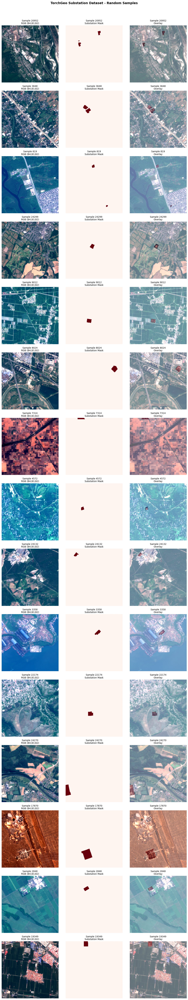

Figure saved to: substation_samples.png


In [6]:
# Create figure with subplots
fig, axes = plt.subplots(num_samples, 3, figsize=(12, 4 * num_samples))

for i, (sample, idx) in enumerate(zip(samples, sample_indices)):
    plot_sample(sample, idx, axes[i, 0], axes[i, 1], axes[i, 2])

plt.suptitle('TorchGeo Substation Dataset - Random Samples', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('substation_samples.png', dpi=150, bbox_inches='tight')
plt.show()

print('Figure saved to: substation_samples.png')

## 6. Use the Built-in Plot Method

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [2.3784313725490196..20.533333333333335].


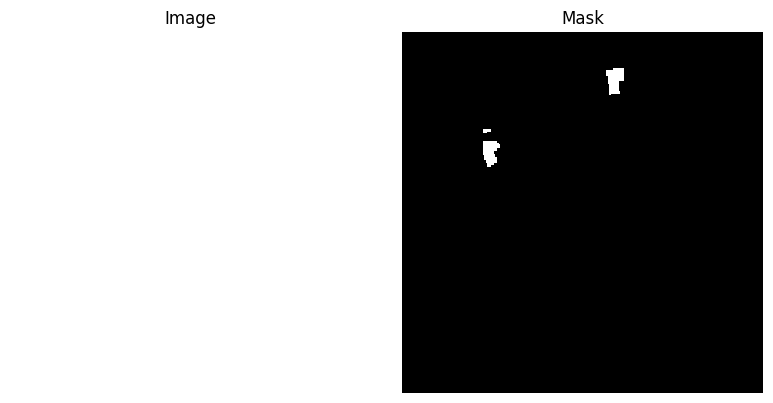

In [7]:
# Use the dataset's built-in plot method for a single sample
fig = dataset.plot(samples[0])
plt.tight_layout()
plt.show()

## 7. Dataset Statistics

In [8]:
# Compute basic statistics from our samples
print('Sample Statistics')
print('=' * 50)

for i, (sample, idx) in enumerate(zip(samples, sample_indices)):
    image = sample['image']
    mask = sample['mask']
    
    # Calculate mask coverage (percentage of substation pixels)
    mask_np = mask.numpy().squeeze()
    coverage = (mask_np > 0).sum() / mask_np.size * 100
    
    print(f'\nSample {idx}:')
    print(f'  Image - min: {image.min():.2f}, max: {image.max():.2f}, mean: {image.mean():.2f}')
    print(f'  Mask coverage: {coverage:.2f}%')

Sample Statistics

Sample 20952:
  Image - min: 7.00, max: 13386.50, mean: 1524.96
  Mask coverage: 0.52%

Sample 3648:
  Image - min: 10.00, max: 5814.00, mean: 1409.43
  Mask coverage: 0.85%

Sample 819:
  Image - min: 8.50, max: 4133.00, mean: 1127.82
  Mask coverage: 0.28%

Sample 24299:
  Image - min: 9.50, max: 11961.50, mean: 1641.07
  Mask coverage: 0.41%

Sample 9012:
  Image - min: 6.00, max: 5567.50, mean: 1583.38
  Mask coverage: 0.48%

Sample 8024:
  Image - min: 4.50, max: 5572.50, mean: 1331.23
  Mask coverage: 0.76%

Sample 7314:
  Image - min: 11.50, max: 4160.50, mean: 1632.49
  Mask coverage: 0.32%

Sample 4572:
  Image - min: 6.50, max: 4908.00, mean: 1330.27
  Mask coverage: 0.25%

Sample 24132:
  Image - min: 8.50, max: 5117.00, mean: 1382.87
  Mask coverage: 0.30%

Sample 3358:
  Image - min: 5.50, max: 4220.00, mean: 915.50
  Mask coverage: 0.48%

Sample 22174:
  Image - min: 12.00, max: 4602.00, mean: 1421.56
  Mask coverage: 0.58%

Sample 24270:
  Image - min:

## 8. Compute Dataset Mean and Std (Welford's Algorithm)

Welford's algorithm computes running mean and variance in a single pass with numerical stability.

In [9]:
from tqdm import tqdm
from torch.utils.data import DataLoader

def compute_mean_std_welford(dataset, batch_size=64, num_workers=4):
    """
    Compute per-channel mean and std of dataset using Welford's online algorithm.
    
    Uses a DataLoader for efficient batch loading and the parallel/batch variant
    of Welford's algorithm for numerical stability.
    
    Welford's parallel combine (merge two batches a and b):
        n = n_a + n_b
        delta = mean_b - mean_a
        mean = mean_a + delta * (n_b / n)
        M2 = M2_a + M2_b + delta^2 * n_a * n_b / n
    
    Args:
        dataset: PyTorch dataset returning dict with 'image' key
        batch_size: Number of samples per batch
        num_workers: Number of parallel data loading workers
    """
    # Get number of channels from first sample
    first_sample = dataset[0]
    n_channels = first_sample['image'].shape[0]
    
    # Initialize Welford accumulators per channel
    n = np.zeros(n_channels, dtype=np.int64)
    mean = np.zeros(n_channels, dtype=np.float64)
    M2 = np.zeros(n_channels, dtype=np.float64)
    
    # Create DataLoader for efficient batched loading
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True
    )
    
    print(f'Computing mean and std over {len(dataset)} samples ({n_channels} channels)...')
    print(f'Using DataLoader with batch_size={batch_size}, num_workers={num_workers}')
    
    for batch in tqdm(dataloader, desc='Processing batches'):
        images = batch['image'].numpy()  # Shape: (B, C, H, W)
        
        for c in range(n_channels):
            # Get all pixels for this channel across the batch: (B, H, W) -> (B*H*W,)
            channel_data = images[:, c, :, :].flatten()
            
            # Remove NaN values
            channel_data = channel_data[~np.isnan(channel_data)]
            
            if len(channel_data) == 0:
                continue
            
            # Compute batch statistics
            n_b = len(channel_data)
            mean_b = np.mean(channel_data)
            M2_b = np.sum((channel_data - mean_b) ** 2)
            
            # Welford's parallel combine
            n_a = n[c]
            if n_a == 0:
                # First batch
                n[c] = n_b
                mean[c] = mean_b
                M2[c] = M2_b
            else:
                # Merge with existing statistics
                n_combined = n_a + n_b
                delta = mean_b - mean[c]
                mean[c] = mean[c] + delta * (n_b / n_combined)
                M2[c] = M2[c] + M2_b + (delta ** 2) * n_a * n_b / n_combined
                n[c] = n_combined
    
    # Compute final variance and std
    variance = M2 / n
    std = np.sqrt(variance)
    
    return mean, std, n

# Compute dataset statistics using DataLoader
mean, std, n_pixels = compute_mean_std_welford(dataset, batch_size=128, num_workers=10)

print('\n' + '=' * 50)
print('Dataset Statistics (Welford\'s Algorithm)')
print('=' * 50)
print(f'Pixels processed per channel: {n_pixels}')
print(f'\nPer-channel Mean: {mean}')
print(f'Per-channel Std:  {std}')
print('\nFormatted for transforms:')
print(f'  mean = [{", ".join(f"{m:.6f}" for m in mean)}]')
print(f'  std  = [{", ".join(f"{s:.6f}" for s in std)}]')

"""
mean [1426.518646, 1222.766702, 1186.455165, 1163.140234, 1404.668460, 2194.835665, 2576.404820, 2498.504302, 2804.435356, 803.489545, 15.708226, 2183.717234, 1471.672056]
std [279.728026, 389.843895, 451.818972, 676.614939, 601.574662, 620.864345, 782.023286, 793.588283, 862.367337, 330.107227, 25.913497, 849.386047, 825.924693]
"""

Computing mean and std over 26522 samples (13 channels)...
Using DataLoader with batch_size=128, num_workers=10


Processing batches:   0%|          | 0/208 [00:27<?, ?it/s]


RuntimeError: Caught RuntimeError in pin memory thread for device 0.
Original Traceback (most recent call last):
  File "/home/admin/anaconda3/envs/ijepa/lib/python3.11/site-packages/torch/utils/data/_utils/pin_memory.py", line 41, in do_one_step
    data = pin_memory(data, device)
           ^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/admin/anaconda3/envs/ijepa/lib/python3.11/site-packages/torch/utils/data/_utils/pin_memory.py", line 75, in pin_memory
    {k: pin_memory(sample, device) for k, sample in data.items()}
  File "/home/admin/anaconda3/envs/ijepa/lib/python3.11/site-packages/torch/utils/data/_utils/pin_memory.py", line 75, in <dictcomp>
    {k: pin_memory(sample, device) for k, sample in data.items()}
        ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/admin/anaconda3/envs/ijepa/lib/python3.11/site-packages/torch/utils/data/_utils/pin_memory.py", line 64, in pin_memory
    return data.pin_memory(device)
           ^^^^^^^^^^^^^^^^^^^^^^^
RuntimeError: CUDA error: invalid argument
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.



## 9. Verify Welford's Algorithm (Two-Pass Comparison)

Compare Welford's online algorithm against the standard two-pass method on a subset to ensure correctness.

In [ ]:
from torch.utils.data import Subset

def compute_mean_std_two_pass(dataset, batch_size=64, num_workers=4):
    """
    Compute per-channel mean and std using the standard two-pass method.
    Pass 1: Compute mean
    Pass 2: Compute variance using the mean
    """
    first_sample = dataset[0]
    n_channels = first_sample['image'].shape[0]
    
    dataloader = DataLoader(
        dataset, batch_size=batch_size, shuffle=False, 
        num_workers=num_workers, pin_memory=True
    )
    
    # Pass 1: Compute mean
    print('Pass 1: Computing mean...')
    pixel_sum = np.zeros(n_channels, dtype=np.float64)
    pixel_count = np.zeros(n_channels, dtype=np.int64)
    
    for batch in tqdm(dataloader, desc='Computing mean'):
        images = batch['image'].numpy()
        for c in range(n_channels):
            channel_data = images[:, c, :, :].flatten()
            valid_data = channel_data[~np.isnan(channel_data)]
            pixel_sum[c] += np.sum(valid_data)
            pixel_count[c] += len(valid_data)
    
    mean = pixel_sum / pixel_count
    
    # Pass 2: Compute variance
    print('Pass 2: Computing variance...')
    sq_diff_sum = np.zeros(n_channels, dtype=np.float64)
    
    for batch in tqdm(dataloader, desc='Computing variance'):
        images = batch['image'].numpy()
        for c in range(n_channels):
            channel_data = images[:, c, :, :].flatten()
            valid_data = channel_data[~np.isnan(channel_data)]
            sq_diff_sum[c] += np.sum((valid_data - mean[c]) ** 2)
    
    variance = sq_diff_sum / pixel_count
    std = np.sqrt(variance)
    
    return mean, std, pixel_count

# Use a subset for faster verification
subset_size = 1000
subset_indices = list(range(subset_size))
subset_dataset = Subset(dataset, subset_indices)

print(f'Verifying on subset of {subset_size} samples...\n')

# Compute using Welford's algorithm
print('=' * 60)
print('Method 1: Welford\'s Online Algorithm')
print('=' * 60)
welford_mean, welford_std, welford_n = compute_mean_std_welford(
    subset_dataset, batch_size=64, num_workers=4
)
print(f'Mean: {welford_mean}')
print(f'Std:  {welford_std}')

# Compute using two-pass method
print('\n' + '=' * 60)
print('Method 2: Two-Pass Standard Method')
print('=' * 60)
twopass_mean, twopass_std, twopass_n = compute_mean_std_two_pass(
    subset_dataset, batch_size=64, num_workers=4
)
print(f'Mean: {twopass_mean}')
print(f'Std:  {twopass_std}')

# Compare results
print('\n' + '=' * 60)
print('Comparison (Welford vs Two-Pass)')
print('=' * 60)
mean_diff = np.abs(welford_mean - twopass_mean)
std_diff = np.abs(welford_std - twopass_std)
mean_rel_diff = mean_diff / twopass_mean * 100
std_rel_diff = std_diff / twopass_std * 100

print(f'Mean absolute difference: {mean_diff}')
print(f'Mean relative difference: {mean_rel_diff}%')
print(f'Std absolute difference:  {std_diff}')
print(f'Std relative difference:  {std_rel_diff}%')

if np.allclose(welford_mean, twopass_mean, rtol=1e-6) and np.allclose(welford_std, twopass_std, rtol=1e-6):
    print('\n✓ Welford\'s algorithm matches the two-pass method!')
else:
    print('\n✗ WARNING: Discrepancy detected between methods!')

## 10. Statistics in Different Value Ranges

Sentinel-2 data can be represented in different scales. This section shows the computed statistics normalized to common ranges.

In [ ]:
# The raw Sentinel-2 values are in Digital Numbers (DN)
# Common scaling factors for Sentinel-2 L2A products:
# - Raw DN: typically 0-10000 (or higher for bright surfaces)
# - Reflectance: DN / 10000 gives surface reflectance (0-1 range)

print('Statistics in Different Value Ranges')
print('=' * 70)

# Use the full dataset mean/std computed earlier
raw_mean = mean  # From Welford computation
raw_std = std
n_channels = len(raw_mean)

print(f'\nNumber of channels: {n_channels}')

print('\n1. RAW Digital Numbers (current dataset format):')
print('-' * 70)
print(f'{"Band":<20} {"Mean":>12} {"Std":>12}')
print('-' * 70)
for i, (m, s) in enumerate(zip(raw_mean, raw_std)):
    band_name = SENTINEL2_BANDS[i] if i < len(SENTINEL2_BANDS) else f'Band {i}'
    print(f'{band_name:<20} {m:>12.2f} {s:>12.2f}')

# Sentinel-2 L2A scaling: DN / 10000 = reflectance
print('\n2. Surface Reflectance (DN / 10000):')
print('-' * 70)
print(f'{"Band":<20} {"Mean":>12} {"Std":>12}')
print('-' * 70)
refl_mean = raw_mean / 10000
refl_std = raw_std / 10000
for i, (m, s) in enumerate(zip(refl_mean, refl_std)):
    band_name = SENTINEL2_BANDS[i] if i < len(SENTINEL2_BANDS) else f'Band {i}'
    print(f'{band_name:<20} {m:>12.6f} {s:>12.6f}')

# Check actual data range
print('\n' + '=' * 70)
print('Actual Data Range Check (from loaded samples):')
print('=' * 70)
all_mins = []
all_maxs = []
for sample in samples:
    img = sample['image']
    all_mins.append(img.min().item())
    all_maxs.append(img.max().item())

print(f'Min value across samples: {min(all_mins):.2f}')
print(f'Max value across samples: {max(all_maxs):.2f}')

# Print in format ready for use in code
print('\n' + '=' * 70)
print('Copy-paste ready format:')
print('=' * 70)
print(f'mean = [{", ".join(f"{m:.4f}" for m in raw_mean)}]')
print(f'std  = [{", ".join(f"{s:.4f}" for s in raw_std)}]')
print('\n# As reflectance (0-1 scale):')
print(f'mean = [{", ".join(f"{m:.6f}" for m in refl_mean)}]')
print(f'std  = [{", ".join(f"{s:.6f}" for s in refl_std)}]')